*This notebook was developed in Google Colab, you may alter the code to run locally or in other environments, mainly the saviung/loading of models/datasets.*

## Install dependencies

In [1]:
!pip install tf-models-official

## Import libraries

In [2]:
import os
import io
import pprint
import tempfile
import matplotlib
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

from PIL import Image
from six import BytesIO
from IPython import display
from urllib.request import urlopen

import orbit
import tensorflow_models as tfm

from official.core import exp_factory
from official.core import config_definitions as cfg
from official.vision.serving import export_saved_model_lib
from official.vision.ops.preprocess_ops import normalize_image
from official.vision.ops.preprocess_ops import resize_and_crop_image
from official.vision.utils.object_detection import visualization_utils
from official.vision.dataloaders.tf_example_decoder import TfExampleDecoder

pp = pprint.PrettyPrinter(indent=4) # Set Pretty Print Indentation
print(tf.__version__) # Check the version of tensorflow used

%matplotlib inline

2.19.0


## Data Preparation

### Download dataset

In [3]:
!curl -L "https://app.roboflow.com/ds/3IcJN1PS6S?key=8s8WmZCcmf" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   901  100   901    0     0   1073      0 --:--:-- --:--:-- --:--:--  1072
100 9249k  100 9249k    0     0  2635k      0  0:00:03  0:00:03 --:--:-- 6309k
Archive:  roboflow.zip
  inflating: README.dataset.txt      
  inflating: README.roboflow.txt     
   creating: test/
  inflating: test/_annotations.coco.json  
 extracting: test/test_1411_jpg.rf.1f470d6d9b55a22c743f6d70a44e6bdc.jpg  
 extracting: test/test_326_jpg.rf.0a3ce5c533f11e56ff11b543480af636.jpg  
   creating: train/
  inflating: train/_annotations.coco.json  
 extracting: train/test_1044_jpg.rf.e2b177d9ccd83a2b6c237c4a325fce03.jpg  
 extracting: train/test_1076_jpg.rf.491dd16db1f8bbac303bb0e4cfcab03d.jpg  
 extracting: train/test_1115_jpg.rf.e70b1319e058d18dbae584307427a75f.jpg  
 extracting: train/test_1166_jpg.rf.e3d067784b3393529c3755bd2029956a.jpg  
 extracting:

### Convert to TFRecords format

In [4]:
%%bash

TRAIN_DATA_DIR='/content/train'
TRAIN_ANNOTATION_FILE_DIR='/content/train/_annotations.coco.json'
OUTPUT_TFRECORD_TRAIN='/content/tfrecords/train'

python -m official.vision.data.create_coco_tf_record --logtostderr \
  --image_dir=${TRAIN_DATA_DIR} \
  --object_annotations_file=${TRAIN_ANNOTATION_FILE_DIR} \
  --output_file_prefix=$OUTPUT_TFRECORD_TRAIN \
  --num_shards=1

VALID_DATA_DIR='/content/valid'
VALID_ANNOTATION_FILE_DIR='/content/valid/_annotations.coco.json'
OUTPUT_TFRECORD_VALID='/content/tfrecords/valid'

python -m official.vision.data.create_coco_tf_record --logtostderr \
  --image_dir=$VALID_DATA_DIR \
  --object_annotations_file=$VALID_ANNOTATION_FILE_DIR \
  --output_file_prefix=$OUTPUT_TFRECORD_VALID \
  --num_shards=1

TEST_DATA_DIR='/content/test'
TEST_ANNOTATION_FILE_DIR='/content/test/_annotations.coco.json'
OUTPUT_TFRECORD_TEST='/content/tfrecords/test'

python -m official.vision.data.create_coco_tf_record --logtostderr \
  --image_dir=$TEST_DATA_DIR \
  --object_annotations_file=$TEST_ANNOTATION_FILE_DIR \
  --output_file_prefix=$OUTPUT_TFRECORD_TEST \
  --num_shards=1

2025-07-22 16:28:18.164195: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1753201698.210621    1262 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1753201698.226655    1262 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1753201698.275798    1262 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1753201698.275834    1262 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1753201698.275837    1262 computation_placer.cc:177] computation placer alr

## Configure Retinanet Model and Custom Dataset

In [5]:
train_data_input_path = '/content/tfrecords/train-00000-of-00001.tfrecord'
valid_data_input_path = '/content/tfrecords/valid-00000-of-00001.tfrecord'
test_data_input_path = '/content/tfrecords/test-00000-of-00001.tfrecord'
model_dir = '/content/trained_model/'
export_dir ='/content/exported_model/'

exp_config = exp_factory.get_exp_config('retinanet_resnetfpn_coco')

### Adjust the model and dataset configurations

In [6]:
batch_size = 4 # decreased from 8 originally because i suspected it was using too much memory, i seemed to be right
num_classes = 1

HEIGHT, WIDTH = 640, 640
IMG_SIZE = [HEIGHT, WIDTH, 3]

# Backbone config.
exp_config.task.freeze_backbone = False
exp_config.task.annotation_file = ''

# Model config.
exp_config.task.model.input_size = IMG_SIZE
exp_config.task.model.num_classes = num_classes + 1
exp_config.task.model.detection_generator.tflite_post_processing.max_classes_per_detection = exp_config.task.model.num_classes
exp_config.task.model.detection_generator.max_num_detections = 250


# Training data config.
exp_config.task.train_data.input_path = train_data_input_path
exp_config.task.train_data.dtype = 'float32'
exp_config.task.train_data.global_batch_size = batch_size
exp_config.task.train_data.parser.aug_scale_max = 1.5 # Added scaling augmentation
exp_config.task.train_data.parser.aug_scale_min = 0.5 # Added scaling augmentation
exp_config.task.train_data.parser.max_num_instances = 250

# Validation data config.
exp_config.task.validation_data.input_path = valid_data_input_path
exp_config.task.validation_data.dtype = 'float32'
exp_config.task.validation_data.global_batch_size = batch_size
exp_config.task.validation_data.parser.max_num_instances = 250

### Adjust the trainer configuration.

In [32]:
logical_device_names = [logical_device.name for logical_device in tf.config.list_logical_devices()]

if 'GPU' in ''.join(logical_device_names):
  print('This may be broken in Colab.')
  device = 'GPU'
elif 'TPU' in ''.join(logical_device_names):
  print('This may be broken in Colab.')
  device = 'TPU'
else:
  print('Running on CPU is slow, so only train for a few steps.')
  device = 'CPU'


train_steps = 4000 # Increased training steps
exp_config.trainer.steps_per_loop = 100 # steps_per_loop = num_of_training_examples // train_batch_size

exp_config.trainer.summary_interval = 100
exp_config.trainer.checkpoint_interval = 500 # Save checkpoints less frequently
exp_config.trainer.validation_interval = 500 # Validate less frequently
exp_config.trainer.validation_steps =  100 # validation_steps = num_of_validation_examples // eval_batch_size
exp_config.trainer.train_steps = train_steps
exp_config.trainer.optimizer_config.warmup.linear.warmup_steps = 500 # Increased warmup steps
exp_config.trainer.optimizer_config.learning_rate.type = 'cosine'
exp_config.trainer.optimizer_config.learning_rate.cosine.decay_steps = train_steps
exp_config.trainer.optimizer_config.learning_rate.cosine.initial_learning_rate = 0.01 # Reduced initial learning rate
exp_config.trainer.optimizer_config.warmup.linear.warmup_learning_rate = 0.005 # Reduced warmup learning rate

This may be broken in Colab.


### Print the modified configuration.

In [8]:
pp.pprint(exp_config.as_dict())
display.Javascript('google.colab.output.setIframeHeight("500px");')
# consider adding hflip augmentation

{   'runtime': {   'all_reduce_alg': None,
                   'batchnorm_spatial_persistent': False,
                   'dataset_num_private_threads': None,
                   'default_shard_dim': -1,
                   'distribution_strategy': 'mirrored',
                   'enable_xla': False,
                   'gpu_thread_mode': None,
                   'loss_scale': None,
                   'mixed_precision_dtype': 'bfloat16',
                   'num_cores_per_replica': 1,
                   'num_gpus': 0,
                   'num_packs': 1,
                   'per_gpu_thread_count': 0,
                   'run_eagerly': False,
                   'task_index': -1,
                   'tpu': None,
                   'tpu_enable_xla_dynamic_padder': None,
                   'use_tpu_mp_strategy': False,
                   'worker_hosts': None},
    'task': {   'allow_image_summary': False,
                'annotation_file': '',
                'differential_privacy_config': None,
     

<IPython.core.display.Javascript object>

### Set up the distribution strategy.

In [9]:
if exp_config.runtime.mixed_precision_dtype == tf.float16:
    tf.keras.mixed_precision.set_global_policy('mixed_float16')

print(''.join(logical_device_names))

if 'GPU' in ''.join(logical_device_names):
  distribution_strategy = tf.distribute.MirroredStrategy()
elif 'TPU' in ''.join(logical_device_names):
  tf.tpu.experimental.initialize_tpu_system()
  tpu = tf.distribute.cluster_resolver.TPUClusterResolver(tpu='/device:TPU_SYSTEM:0')
  distribution_strategy = tf.distribute.experimental.TPUStrategy(tpu)
else:
  print('Warning: this will be really slow.')
  distribution_strategy = tf.distribute.OneDeviceStrategy(logical_device_names[0])

print('Done')

/device:CPU:0/device:GPU:0
Done


## Create Task

In [10]:
with distribution_strategy.scope():
  task = tfm.core.task_factory.get_task(exp_config.task, logging_dir=model_dir)

## Visualize dataset

In [11]:
for images, labels in task.build_inputs(exp_config.task.train_data).take(1):
  print()
  print(f'images.shape: {str(images.shape):16}  images.dtype: {images.dtype!r}')
  print(f'labels.keys: {labels.keys()}')


images.shape: (2, 640, 640, 3)  images.dtype: tf.float32
labels.keys: dict_keys(['cls_targets', 'box_targets', 'anchor_boxes', 'cls_weights', 'box_weights', 'image_info'])


### Create category index dictionary to map the labels to coressponding label names.

In [12]:
category_index={
    1: {
        'id': 1,
        'name': 'object'
       }
}
tf_ex_decoder = TfExampleDecoder()

### Helper function for visualizing the results from TFRecords.

In [13]:
def show_batch(raw_records, num_of_examples):
  plt.figure(figsize=(20, 20))
  use_normalized_coordinates=True
  min_score_thresh = 0.30
  for i, serialized_example in enumerate(raw_records):
    plt.subplot(1, 3, i + 1)
    decoded_tensors = tf_ex_decoder.decode(serialized_example)
    image = decoded_tensors['image'].numpy().astype('uint8')
    scores = np.ones(shape=(len(decoded_tensors['groundtruth_boxes'])))
    visualization_utils.visualize_boxes_and_labels_on_image_array(
        image,
        decoded_tensors['groundtruth_boxes'].numpy(),
        decoded_tensors['groundtruth_classes'].numpy().astype('int'),
        scores,
        category_index=category_index,
        use_normalized_coordinates=use_normalized_coordinates,
        max_boxes_to_draw=200,
        min_score_thresh=min_score_thresh,
        agnostic_mode=False,
        instance_masks=None,
        line_thickness=4)

    plt.imshow(image)
    plt.axis('off')
    plt.title(f'Image-{i+1}')
  plt.show()

### Visualization of train data

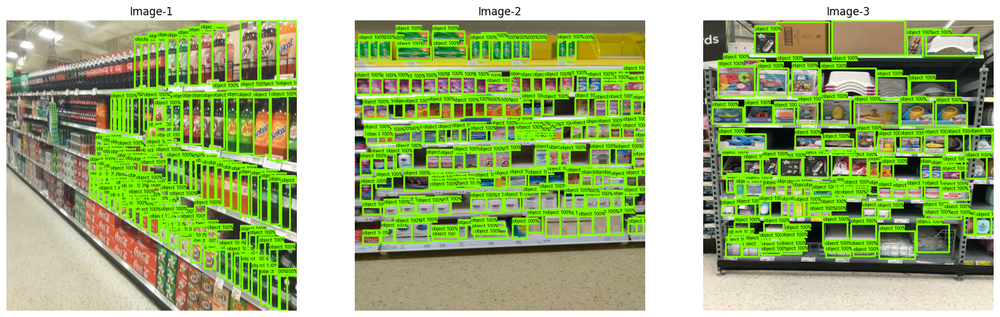

In [14]:
buffer_size = 20
num_of_examples = 3

raw_records = tf.data.TFRecordDataset(
    exp_config.task.train_data.input_path).shuffle(
        buffer_size=buffer_size).take(num_of_examples)
show_batch(raw_records, num_of_examples)

## Train and evaluate.
Based on mAP (mean Average Precision)

In [33]:
model, eval_logs = tfm.core.train_lib.run_experiment(
    distribution_strategy=distribution_strategy,
    task=task,
    mode='train_and_eval',
    params=exp_config,
    model_dir=model_dir,
    run_post_eval=True)

restoring or initializing model...
restored model from /content/trained_model/ckpt-3600.
restored from checkpoint: /content/trained_model/ckpt-3600
train | step:   3600 | training until step 4000...
train | step:   3700 | steps/sec:    1.2 | output: 
    {'box_loss': 0.0031611219,
     'cls_loss': 0.19630624,
     'learning_rate': 0.00013815015,
     'model_loss': 0.35436225,
     'total_loss': 0.7718072,
     'training_loss': 0.7718072}
train | step:   3800 | steps/sec:    1.6 | output: 
    {'box_loss': 0.0023865094,
     'cls_loss': 0.17853303,
     'learning_rate': 6.155819e-05,
     'model_loss': 0.29785842,
     'total_loss': 0.7152859,
     'training_loss': 0.7152859}
train | step:   3900 | steps/sec:    1.5 | output: 
    {'box_loss': 0.002389199,
     'cls_loss': 0.17865534,
     'learning_rate': 1.5413165e-05,
     'model_loss': 0.29811537,
     'total_loss': 0.71553713,
     'training_loss': 0.71553713}
train | step:   4000 | steps/sec:    1.5 | output: 
    {'box_loss': 0.0

## Load logs in tensorboard.

In [35]:
%load_ext tensorboard
%tensorboard --logdir './trained_model/'

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

## Saving and exporting the trained model.

In [39]:
export_saved_model_lib.export_inference_graph(
    input_type='image_tensor',
    batch_size=1,
    input_image_size=[HEIGHT, WIDTH],
    params=exp_config,
    checkpoint_path=tf.train.latest_checkpoint(model_dir),
    export_dir=export_dir)

In [40]:
from google.colab import drive
import os
import shutil

# Mount Google Drive
drive.mount('/content/drive')

# Define the source and destination paths
source_dir = '/content/exported_model'
destination_dir = '/content/drive/MyDrive/exported_object_detection_model' # You can change this path

# Create the destination directory if it doesn't exist
if not os.path.exists(destination_dir):
    os.makedirs(destination_dir)

# Copy the directory
try:
    shutil.copytree(source_dir, destination_dir, dirs_exist_ok=True)
    print(f"Successfully copied '{source_dir}' to '{destination_dir}'")
except Exception as e:
    print(f"Error copying directory: {e}")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Successfully copied '/content/exported_model' to '/content/drive/MyDrive/exported_object_detection_model'


## Inference from trained model

In [41]:
def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array and return original size.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: the file path to the image

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3) and original (width, height)
  """
  image = None
  if(path.startswith('http')):
    response = urlopen(path)
    image_data = response.read()
    image_data = BytesIO(image_data)
    image = Image.open(image_data)
  else:
    image_data = tf.io.gfile.GFile(path, 'rb').read()
    image = Image.open(BytesIO(image_data))

  (im_width, im_height) = image.size
  # Convert the image to RGB format and then to a numpy array
  return np.array(image.convert('RGB')), (im_width, im_height)


def build_inputs_for_object_detection(image, input_image_size):
  """Builds Object Detection model inputs for serving."""
  image, _ = resize_and_crop_image(
      image,
      input_image_size,
      padded_size=input_image_size,
      aug_scale_min=1.0,
      aug_scale_max=1.0)
  return image

### Visualize test data.

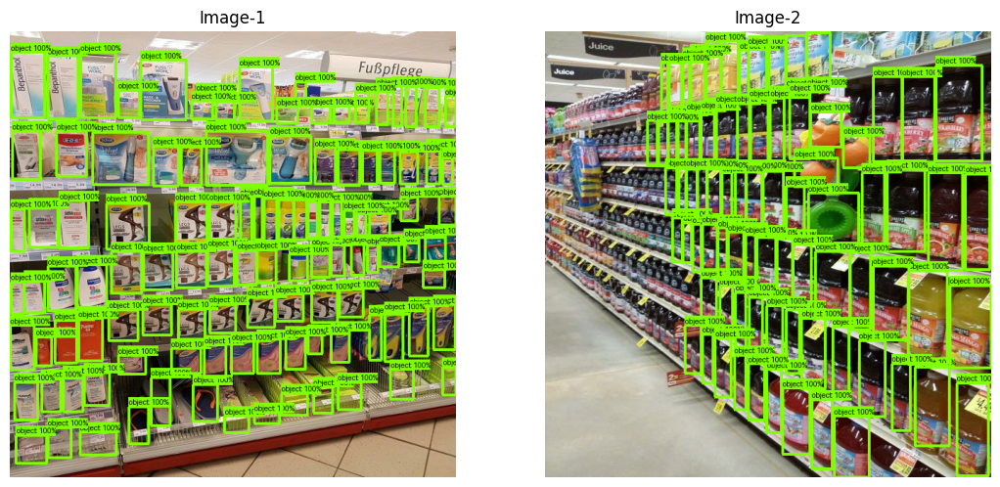

In [42]:
num_of_examples = 3

test_ds = tf.data.TFRecordDataset(
    '/content/tfrecords/test-00000-of-00001.tfrecord').take(
        num_of_examples)
show_batch(test_ds, num_of_examples)

### Importing SavedModel.

In [43]:
from google.colab import drive
import os
import tensorflow as tf

# Mount Google Drive
drive.mount('/content/drive')

# Define the path to the exported model in your Google Drive
drive_model_path = '/content/drive/MyDrive/exported_object_detection_model' # Make sure this path is correct

# Load the saved model from Google Drive
try:
    imported_from_drive = tf.saved_model.load(drive_model_path)
    model_fn_from_drive = imported_from_drive.signatures['serving_default']
    print(f"Successfully loaded model from '{drive_model_path}'")
except Exception as e:
    print(f"Error loading model from Google Drive: {e}")
    imported_from_drive = None
    model_fn_from_drive = None

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Successfully loaded model from '/content/drive/MyDrive/exported_object_detection_model'


### Visualize predictions.

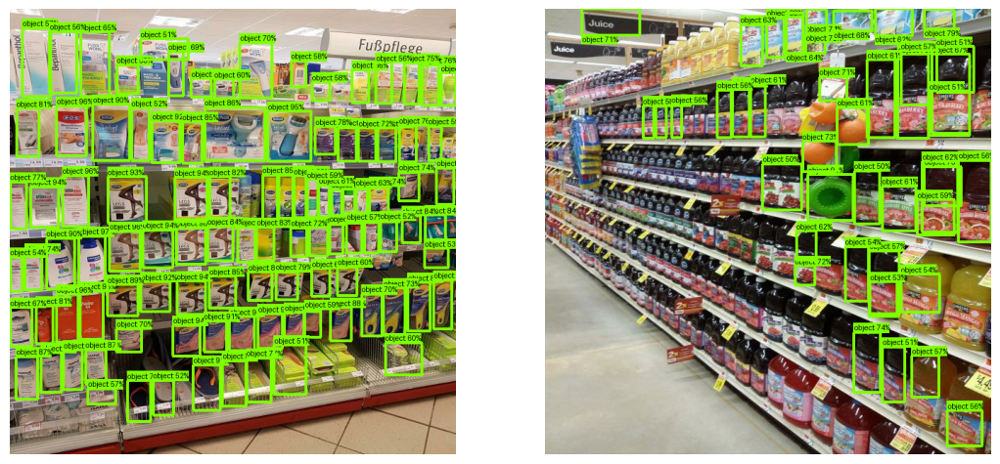

In [46]:
input_image_size = (HEIGHT, WIDTH)
plt.figure(figsize=(20, 20))
min_score_thresh = 0.50 # Change minimum score for threshold to see all bounding boxes confidences.

for i, serialized_example in enumerate(test_ds):
  plt.subplot(1, 3, i+1)
  decoded_tensors = tf_ex_decoder.decode(serialized_example)
  image = build_inputs_for_object_detection(decoded_tensors['image'], input_image_size)
  image = tf.expand_dims(image, axis=0)
  image = tf.cast(image, dtype = tf.uint8)
  image_np = image[0].numpy()
  result = model_fn_from_drive(image)
  visualization_utils.visualize_boxes_and_labels_on_image_array(
      image_np,
      result['detection_boxes'][0].numpy(),
      result['detection_classes'][0].numpy().astype(int),
      result['detection_scores'][0].numpy(),
      category_index=category_index,
      use_normalized_coordinates=False,
      max_boxes_to_draw=200,
      min_score_thresh=min_score_thresh,
      agnostic_mode=False,
      instance_masks=None,
      line_thickness=4)
  plt.imshow(image_np)
  plt.axis('off')

plt.show()

Number of detections visualized (score > 0.5): 111


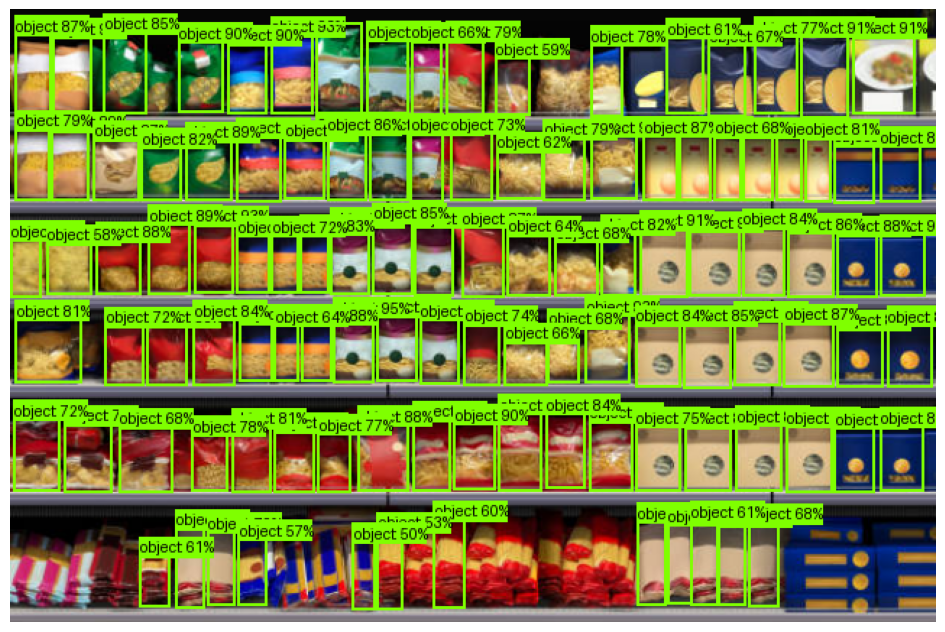

In [47]:
# URL of the image you want to test
image_url = 'https://media.istockphoto.com/id/1412238893/photo/spaghetti-pasta-fusilli-lasagna-packagings-on-shelf-at-supermarket-3d-illustration.jpg?s=612x612&w=0&k=20&c=kpU6rRZn5_KnsIroyka05xc-RiTkiRx43JERRN2UFnM='  # Replace with your image URL

# Load the image from the URL and get original dimensions
original_image_np, original_size = load_image_into_numpy_array(image_url)
original_width, original_height = original_size


# Preprocess the image for the model
image = build_inputs_for_object_detection(tf.constant(original_image_np, dtype=tf.uint8), input_image_size)
image = tf.expand_dims(image, axis=0)
image = tf.cast(image, dtype = tf.uint8)

# Run inference
result = model_fn_from_drive(image)

detections_above_threshold = np.sum(result['detection_scores'][0].numpy() > min_score_thresh)
print(f"Number of detections visualized (score > {min_score_thresh}): {detections_above_threshold}")


# Visualize the results on the processed image
image_np_with_detections = image[0].numpy()
visualization_utils.visualize_boxes_and_labels_on_image_array(
    image_np_with_detections,
    result['detection_boxes'][0].numpy(),
    result['detection_classes'][0].numpy().astype(int),
    result['detection_scores'][0].numpy(),
    category_index=category_index,
    use_normalized_coordinates=False,
    max_boxes_to_draw=200,
    min_score_thresh=min_score_thresh,
    agnostic_mode=False,
    instance_masks=None,
    line_thickness=2)

# Calculate padding and crop the visualized image to original aspect ratio
model_height, model_width = input_image_size
model_aspect_ratio = model_width / model_height
original_aspect_ratio = original_width / original_height

if original_aspect_ratio > model_aspect_ratio:
    # Padding is on the height (top and bottom)
    scaled_height = int(model_width / original_aspect_ratio)
    padding_on_height = model_height - scaled_height
    # Crop from the bottom
    cropped_image_np = image_np_with_detections[:model_height - padding_on_height, :, :]
else:
    # Padding is on the width (left and right)
    scaled_width = int(model_height * original_aspect_ratio)
    padding_on_width = model_width - scaled_width
    # No cropping from the bottom needed in this case, padding is on the sides
    cropped_image_np = image_np_with_detections


plt.figure(figsize=(12, 12 * original_height / original_width)) # Adjust figure size based on original aspect ratio
plt.imshow(cropped_image_np)
plt.axis('off')
plt.show()

In [48]:
from PIL import Image
import os

# Define the path to save the image in Google Drive
output_image_path = '/content/drive/MyDrive/object_detection_output.jpg'  # You can change the filename and path

# Ensure the directory exists
output_dir = os.path.dirname(output_image_path)
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Convert the numpy array (cropped_image_np) to a PIL Image
output_image = Image.fromarray(cropped_image_np.astype('uint8'))

# Save the image to Google Drive
try:
    output_image.save(output_image_path)
    print(f"Output image saved successfully to '{output_image_path}'")
except Exception as e:
    print(f"Error saving image to Google Drive: {e}")

Output image saved successfully to '/content/drive/MyDrive/object_detection_output.jpg'
